# Results Final

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
import random
warnings.filterwarnings('ignore')
%matplotlib inline

## Data import and decribe

In [2]:
df1 = pd.read_csv("Dataset v1.csv")
heldout=pd.read_csv("heldout.csv")
df2= pd.read_csv("Dataset v2.csv")
df3= pd.read_csv("Dataset v3.csv")
df4= pd.read_csv("Dataset v4.csv")
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn import metrics
from sklearn.model_selection import KFold

def mean_relative_absolute_error(y_true, y_pred):
    x=sum(np.abs((y_true - y_pred)) / y_true ) /len(y_true)
    return x

In [3]:
df33=df3[['Rms','clx','cly','Skewness','Kurtosis','Area']]

In [4]:
df33.drop([2891],inplace=True)

y1=df33['Area']
X1=df33[['Rms','clx','cly','Skewness','Kurtosis']]

In [5]:
df33.describe()

,Rms,clx,cly,Skewness,Kurtosis,Area
count,3053.000000,3053.000000,3053.000000,3053.000000,3053.000000,3053.000000
mean,0.031818,0.215624,0.214187,0.024124,5.513888,72.456063
std,0.016403,0.088406,0.088364,1.137891,2.306104,8.739961
min,0.004013,0.054494,0.049875,-2.747300,1.497900,64.035000
25%,0.017517,0.139360,0.138540,-0.824070,3.565300,65.887000
50%,0.031769,0.216820,0.213680,0.025149,5.470800,69.877000
75%,0.046358,0.289080,0.287300,0.844740,7.536100,75.456000
max,0.060049,0.465580,0.435600,2.724300,9.560700,117.950000


In [6]:
y1_held=heldout['Area']
X1_held=heldout[['Rms','clx','cly','Skewness','Kurtosis']]

In [7]:
heldout[['Rms','clx','cly','Skewness','Kurtosis','Area']].describe()

,Rms,clx,cly,Skewness,Kurtosis,Area
count,15288.000000,15288.000000,15288.000000,15288.000000,15288.000000,15288.000000
mean,0.029002,0.210099,0.210005,-0.081806,5.382781,73.232645
std,0.017080,0.100984,0.101117,1.130900,1.975513,10.775388
min,0.003973,0.046519,0.046790,-2.369700,1.488700,64.026000
25%,0.014001,0.115830,0.115950,-0.949342,3.508200,65.359000
50%,0.028975,0.211295,0.210665,-0.054045,5.504200,69.253500
75%,0.044004,0.294695,0.294980,0.798845,7.464000,76.840250
max,0.054360,0.474560,0.500690,2.166300,7.614100,131.250000


# Database overview

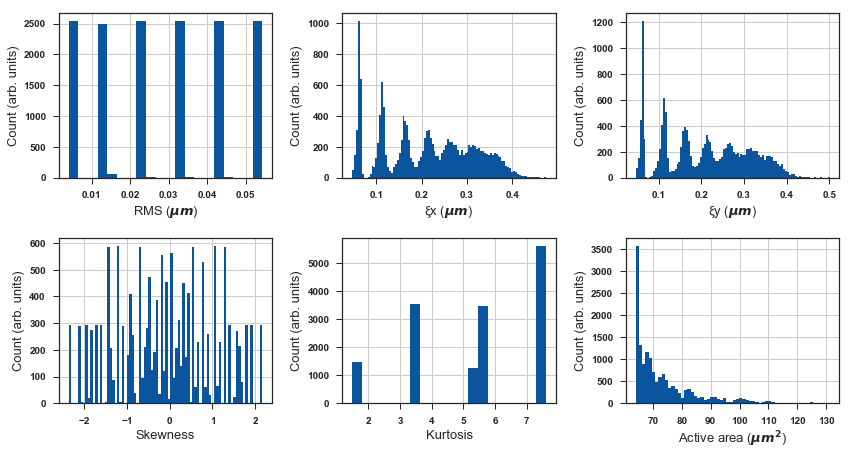

In [8]:
f = plt.figure(figsize=(12,9))
font = {'family' : 'normal',
       'weight' : 'bold',
       'size'   : 27}

plt.rc('font', **font)
sns.set(style="ticks", palette="Blues_r" )
ax = f.add_subplot(331 )
ax = heldout['Rms'].hist(bins=20)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('RMS ($μm$)',fontsize=13)
#plt.title('RMS',fontsize=10)

ax2 = f.add_subplot(332)

ax2 =  heldout['clx'].hist(bins=100)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('ξx ($μm$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax3 = f.add_subplot(333)

ax3 =  heldout['cly'].hist(bins=100)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('ξy ($μm$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax4 = f.add_subplot(334)


ax4 =  heldout['Skewness'].hist(bins=80)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Skewness',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax5 = f.add_subplot(335)

ax5 =  heldout['Kurtosis'].hist(bins=20)

plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Kurtosis',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax6 = f.add_subplot(336)

ax6 =  heldout['Area'].hist(bins=60)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Active area ($μm^2$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
#plt.rc('xtick', labelsize=35) 
#plt.rc('ytick', labelsize=35) 
f.tight_layout()
plt.rc('xtick', labelsize=5)    # fontsize of the tick labels
plt.rc('ytick', labelsize=5) 
#plt.rcParams['xtick.major.size'] = 20
#plt.rcParams['xtick.major.width'] = 5
#plt.rcParams['ytick.minor.size'] = 20
#plt.rcParams['ytick.minor.width'] = 5

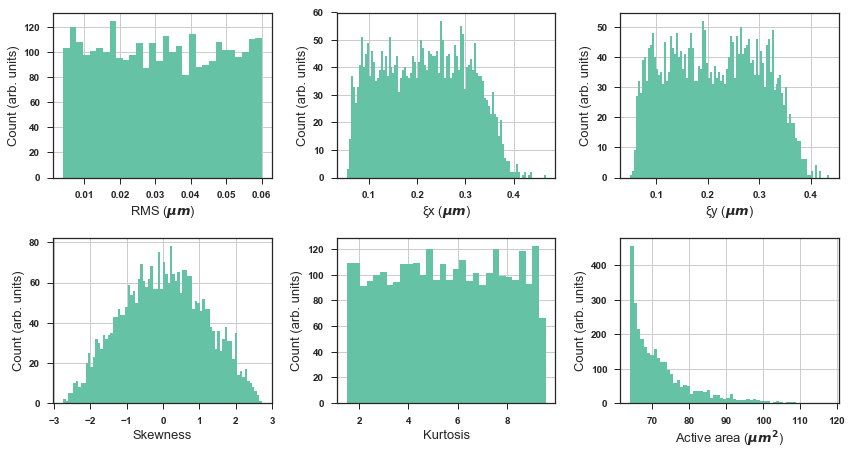

In [9]:
f = plt.figure(figsize=(12,9))
font = {'family' : 'normal',
       'weight' : 'bold',
       'size'   : 27}

plt.rc('font', **font)
sns.set(style="ticks", palette="Set2" )
ax = f.add_subplot(331 )
ax = df33['Rms'].hist(bins=30)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('RMS ($μm$)',fontsize=13)
#plt.title('RMS',fontsize=10)

ax2 = f.add_subplot(332)

ax2 =  df33['clx'].hist(bins=100)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('ξx ($μm$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax3 = f.add_subplot(333)

ax3 =  df33['cly'].hist(bins=100)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('ξy ($μm$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax4 = f.add_subplot(334)


ax4 =  df33['Skewness'].hist(bins=80)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Skewness',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax5 = f.add_subplot(335)

ax5 =  df33['Kurtosis'].hist(bins=30)

plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Kurtosis',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
ax6 = f.add_subplot(336)

ax6 =  df33['Area'].hist(bins=60)
plt.ylabel('Count (arb. units)',fontsize=13)
plt.xlabel('Active area ($μm^2$)',fontsize=13)
#plt.title('Linear regression (Train size= 610)',fontsize=10)
f.tight_layout()

## Linear Regression

In [12]:
from sklearn import linear_model
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(80,81,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_new5 = pd.DataFrame(lst2, columns=cols)
df_new5


80


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,80,610,9.52855,0.074584,0.052223,0.000683,0.840889,0.000439


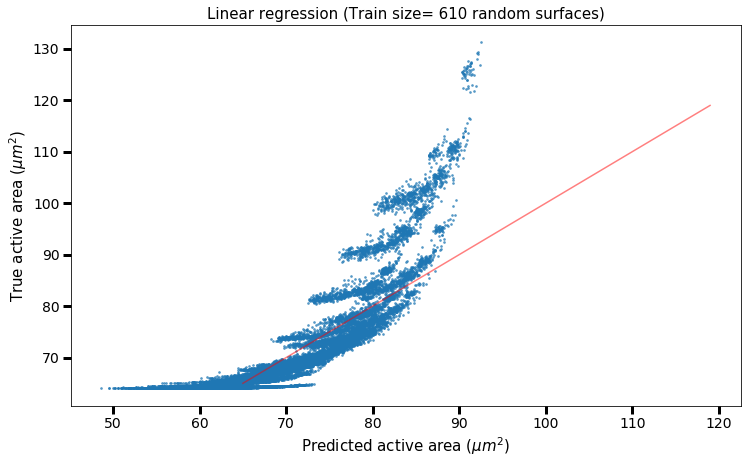

In [13]:
plt.figure(figsize=(12,7))
plt.scatter(pre,y1_held,alpha=0.6,s=3)
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Linear regression (Train size= 610 random surfaces)',fontsize=15)
plt.tick_params(direction='out', length=8, width=3,
                grid_alpha=0.5,labelsize=14)
plt.show()

In [36]:
heldout[['Rms','clx','cly','Skewness','Kurtosis','Area']][heldout['Area']<66].describe()

,Rms,clx,cly,Skewness,Kurtosis,Area
count,4583.000000,4583.000000,4583.000000,4583.000000,4583.000000,4583.000000
mean,0.009453,0.235820,0.235599,-0.061857,5.426702,64.628028
std,0.006738,0.097421,0.097284,1.112552,1.944523,0.594624
min,0.003973,0.048137,0.048002,-2.369700,1.488700,64.026000
25%,0.003999,0.160815,0.160465,-0.946220,3.508850,64.116000
50%,0.004009,0.243680,0.244200,-0.050657,5.507700,64.396000
75%,0.014004,0.316750,0.314925,0.798835,7.466700,65.050000
max,0.034040,0.474560,0.500690,2.164100,7.614100,65.998000


In [29]:
heldout[heldout['Rms']<70]

,N,Sq Length,input clx,GRms,GErrorRms,G clx,G Error clx,G clx.1,G Error clx.1,G Area,...,clx,Error clx,cly,Error cly,Area,Error Area,Skewness,Error Sk,Kurtosis,Error Ku
0,600,8,0.36,1,0,1,0,1,0,1,...,0.117720,0,0.391510,0,77.422,0,0.546830,0,5.5054,0
1,600,8,0.36,1,0,1,0,1,0,1,...,0.171740,0,0.396190,0,69.245,0,-1.340300,0,7.6015,0
2,600,8,0.36,1,0,1,0,1,0,1,...,0.303740,0,0.326380,0,68.007,0,-2.100100,0,7.5139,0
3,600,8,0.31,1,0,1,0,1,0,1,...,0.288060,0,0.342810,0,69.023,0,0.065295,0,5.4356,0
4,600,8,0.21,1,0,1,0,1,0,1,...,0.262900,0,0.237510,0,68.353,0,1.054100,0,5.5544,0
5,600,8,0.36,1,0,1,0,1,0,1,...,0.209840,0,0.373930,0,73.534,0,0.799340,0,3.4990,0
6,600,8,0.26,1,0,1,0,1,0,1,...,0.322190,0,0.283370,0,67.063,0,1.050500,0,3.4961,0
7,600,8,0.16,1,0,1,0,1,0,1,...,0.117780,0,0.170950,0,88.062,0,-0.590030,0,7.4247,0
8,600,8,0.36,1,0,1,0,1,0,1,...,0.330080,0,0.357800,0,65.203,0,0.286020,0,5.4581,0
9,600,8,0.11,1,0,1,0,1,0,1,...,0.057326,0,0.101190,0,64.527,0,1.305300,0,3.5150,0


In [58]:
from sklearn.cluster import DBSCAN
XY=np.vstack((pre,y1_held.values)).T
db = DBSCAN(eps=0.8, min_samples=7).fit(XY)
#db.labels_ gives an array with labeled clusters as (0,1,2,3...cluster_length) -1 labeled as noise data
core_samples_mask = np.zeros_like(db.labels_, dtype=bool) 
#core_samples_mask creates an array same size as db.labels_ but with False in every cell
core_samples_mask[db.core_sample_indices_] = True
#core points are True (noise and reachable points are False) (might want to change that...)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)
#print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(XY, labels))

Estimated number of clusters: 4


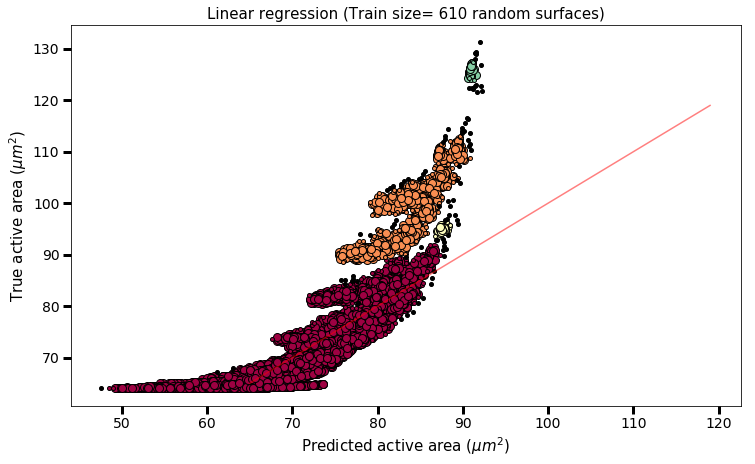

In [61]:
# Black removed and is used for noise instead.
plt.figure(figsize=(12,7))
unique_labels = set(labels) #builds an ordered collection (set) of unique elements
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))] # different pallete of colors in lists example: [(0.66, 0.003, 0.2, 1.
for k, col in zip(unique_labels, colors):
    if k == -1:
        
        col = [0, 0, 0, 1]                                         # Black used for noise.

    class_member_mask = (labels == k)

    xyy = XY[class_member_mask & core_samples_mask]
    
    plt.plot(xyy[:, 0], xyy[:, 1], 'o', markerfacecolor=tuple(col), # large size for the core points
             markeredgecolor='k', markersize=8)

    xyy = XY[class_member_mask & ~core_samples_mask]
    
    plt.plot(xyy[:, 0], xyy[:, 1], 'o', markerfacecolor=tuple(col), # small size for the reachable points
             markeredgecolor='k', markersize=4)

x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Linear regression (Train size= 610 random surfaces)',fontsize=15)
plt.tick_params(direction='out', length=8, width=3,
                grid_alpha=0.5,labelsize=14)
plt.show()

In [24]:
dfclust=heldout[['Rms','clx','cly','Skewness','Kurtosis','Area']]

In [25]:
dfclust['labels']=db.labels_

In [27]:
dfclust[dfclust['labels']==1].describe()

,Rms,clx,cly,Skewness,Kurtosis,Area,labels
count,1343.000000,1343.000000,1343.000000,1343.000000,1343.000000,1343.000000,1343.0
mean,0.048165,0.137807,0.137834,-0.081339,5.403700,98.671437,1.0
std,0.005703,0.100430,0.099956,1.133965,1.961067,6.369209,0.0
min,0.033830,0.046519,0.047715,-2.362600,1.492700,88.493000,1.0
25%,0.043987,0.061946,0.062175,-0.951265,3.510050,92.604000,1.0
50%,0.044113,0.065368,0.065511,-0.054000,5.506100,98.999000,1.0
75%,0.053992,0.211470,0.210815,0.801070,7.463750,102.740000,1.0
max,0.054324,0.392170,0.391280,2.158800,7.613600,113.040000,1.0


In [28]:
dfclust[dfclust['labels']==0].describe()

,Rms,clx,cly,Skewness,Kurtosis,Area,labels
count,13819.000000,13819.000000,13819.000000,13819.000000,13819.000000,13819.000000,13819.0
mean,0.026918,0.218190,0.218107,-0.081501,5.385642,70.436426,0.0
std,0.016551,0.097876,0.098079,1.131112,1.973791,6.334414,0.0
min,0.003973,0.046752,0.047043,-2.369700,1.488700,64.027000,0.0
25%,0.013993,0.129835,0.129935,-0.949220,3.508150,65.062500,0.0
50%,0.024023,0.217090,0.216580,-0.053973,5.504300,68.473000,0.0
75%,0.043921,0.300030,0.300050,0.798810,7.464200,73.981500,0.0
max,0.054360,0.474560,0.500690,2.166300,7.614100,92.428000,0.0


In [8]:
from sklearn import linear_model
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,99,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_new5 = pd.DataFrame(lst2, columns=cols)
df_new5

90
91
92
93
94
95
96
97
98


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,9.543711,0.120528,0.052519,0.001240,0.840213,0.000961
1,91,274,9.565506,0.146351,0.053022,0.001584,0.839919,0.001092
2,92,244,9.582559,0.101519,0.051992,0.000830,0.839735,0.000952
3,93,213,9.618189,0.153466,0.052373,0.001356,0.839795,0.001549
4,94,183,9.586798,0.201341,0.052925,0.001824,0.838509,0.001784
5,95,152,9.677372,0.140621,0.053063,0.002156,0.838474,0.001710
6,96,122,9.677219,0.195106,0.053540,0.003023,0.837691,0.001890
7,97,91,9.711140,0.318188,0.054694,0.004411,0.836940,0.005119
8,98,61,9.786544,0.311494,0.055611,0.004303,0.830373,0.007922


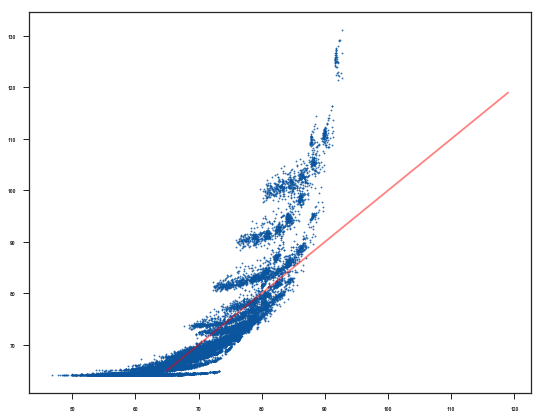

In [9]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.8,s=2)
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.show()

error traveler plot

In [10]:
from sklearn import linear_model
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in [30,40,50,60,70,80,90,92,94,96,98,99]:
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_reg1 = pd.DataFrame(lst2, columns=cols)
df_reg1

30
40
50
60
70
80
90
92
94
96
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,30,2137,9.502391,0.025735,0.052069,0.000318,0.841350,0.000100
1,40,1831,9.530399,0.032113,0.051902,0.000336,0.841348,0.000144
2,50,1526,9.512537,0.052312,0.052015,0.000478,0.841309,0.000140
3,60,1221,9.516200,0.050992,0.052026,0.000488,0.841096,0.000244
4,70,915,9.539060,0.089423,0.051921,0.000834,0.841119,0.000164
5,80,610,9.514648,0.080707,0.052118,0.000795,0.840962,0.000415
6,90,305,9.591191,0.125100,0.052176,0.001242,0.839857,0.001598
7,92,244,9.633032,0.190220,0.052218,0.001552,0.839701,0.001635
8,94,183,9.659564,0.260712,0.052849,0.002143,0.838445,0.002151
9,96,122,9.601563,0.205545,0.053859,0.002076,0.837888,0.002489


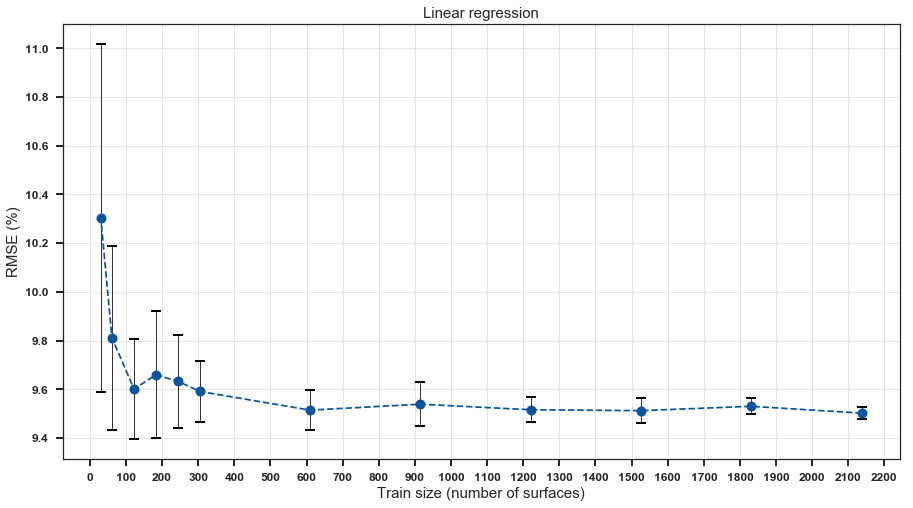

In [11]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10)
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15,)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 100
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Linear regression',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)
show()

In [63]:

#xlabels = boston.feature_names[which_betas]
#stats.summary(regr,X_train, y_train, xlabels)
coeff_df = pd.DataFrame(regr.coef_,X_train.columns,columns=['Coefficient'])
coeff_df


,Coefficient
Rms,369.165648
clx,-31.640383
cly,-36.146665
Skewness,-0.168435
Kurtosis,-0.065010


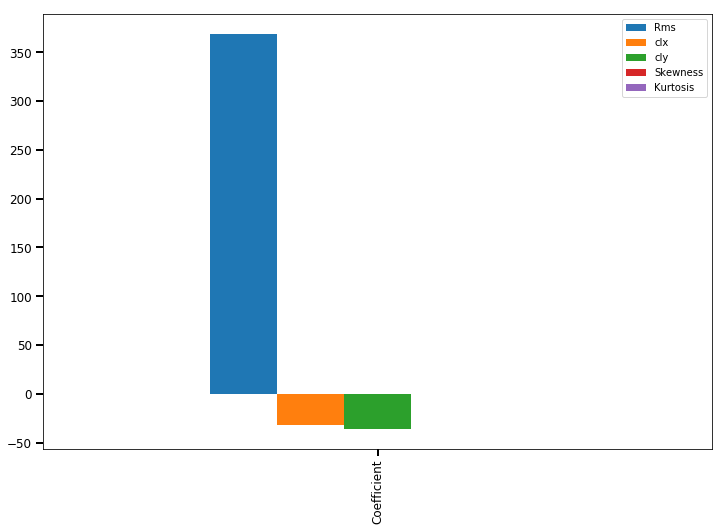

In [65]:
#df11=pd.DataFrame(coeff_df)
#df22=df11.transpose()
plt.Figure(figsize=(12,3))
coeff_df.transpose().plot.bar(figsize=(12,8))
plt.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)

In [ ]:
############################################################

In [47]:
#1400 epifaneies
rmse1=[10,4,10.2,8,3.5]
rmse2=[10.2,10.4,36,35.5,3.6]
models=['Linear Regresion','Random Forests','Simple NN','Complex NN','Deep NN']


In [49]:
df1_ = pd.DataFrame(rmse1,models,columns=['RMSE(%)'])
df1_

df2_ = pd.DataFrame(rmse2,models,columns=['RMSE(%)'])
df2_

,RMSE(%)
Linear Regresion,10.2
Random Forests,10.4
Simple NN,36.0
Complex NN,35.5
Deep NN,3.6


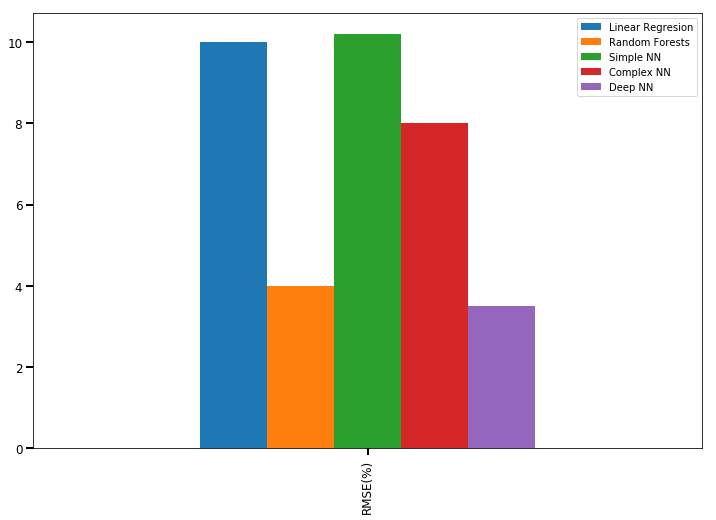

In [54]:
plt.Figure(figsize=(12,3))
df1_.transpose().plot.bar(figsize=(12,8))
plt.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)

In [ ]:
############################################################

In [10]:
from sklearn import linear_model
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,100,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = linear_model.LinearRegression(fit_intercept=True, normalize=True, copy_X=True, n_jobs=1)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_reg2 = pd.DataFrame(lst2, columns=cols)
df_reg2

90
91
92
93
94
95
96
97
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,9.540323,0.142876,0.052188,0.001007,0.840146,0.001060
1,91,274,9.600038,0.134026,0.051990,0.001275,0.840274,0.001054
2,92,244,9.589668,0.173966,0.052496,0.001520,0.839373,0.001634
3,93,213,9.627015,0.169151,0.051867,0.001294,0.839855,0.001114
4,94,183,9.629357,0.167290,0.052058,0.001461,0.839785,0.001618
5,95,152,9.658580,0.232819,0.052856,0.002294,0.838389,0.002317
6,96,122,9.728660,0.280931,0.052743,0.002453,0.838343,0.002209
7,97,91,9.761971,0.345484,0.053130,0.002855,0.837230,0.003245
8,98,61,9.958296,0.481793,0.054286,0.003641,0.831154,0.007378
9,99,30,10.267985,0.675139,0.056174,0.005096,0.825140,0.012407


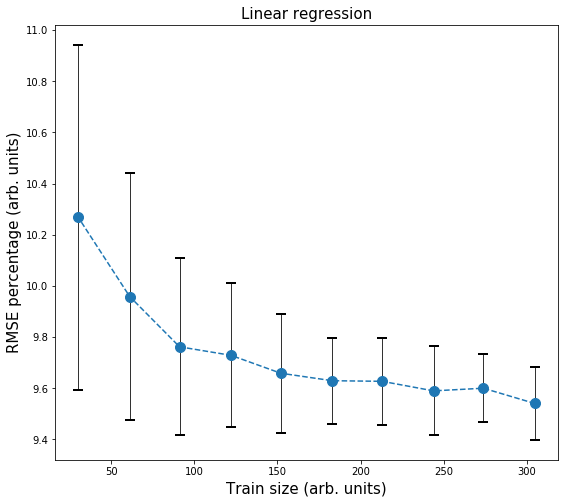

In [11]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10)
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 50
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Linear regression',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
show()

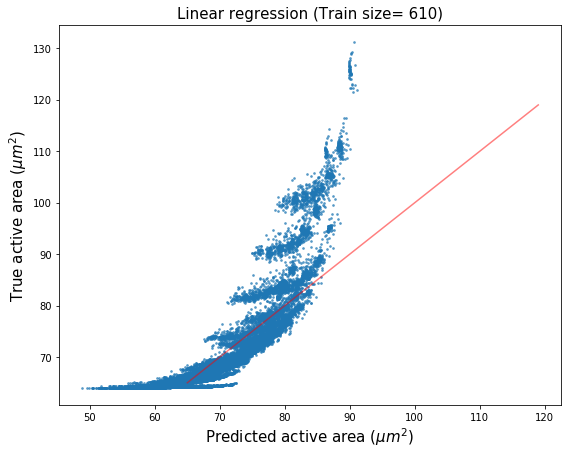

In [25]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.6,s=3)
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Linear regression (Train size= 610)',fontsize=15)
plt.show()

## Neural Networks

In [12]:
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,100,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        mlpred=MLPRegressor(random_state=25,hidden_layer_sizes=(15,25,40,25,15),batch_size=20,activation='relu')
        mlpred.fit(X_train, y_train)
        pre= mlpred.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1),np.std(lst1),np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_new5 = pd.DataFrame(lst2, columns=cols)
df_new5

90
91
92
93
94
95
96
97
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,9.303795,1.176144,0.079489,0.010705,0.546248,0.273184
1,91,274,9.069308,1.155110,0.080678,0.012139,0.575889,0.277709
2,92,244,9.672813,1.421136,0.087693,0.013202,0.446183,0.396872
3,93,213,9.787912,1.151102,0.085471,0.012321,0.429731,0.322640
4,94,183,11.183758,0.717303,0.098105,0.006570,0.016804,0.272099
5,95,152,10.944132,0.821055,0.099728,0.008760,0.027947,0.267631
6,96,122,11.878411,0.468099,0.106128,0.011141,-0.187860,0.068439
7,97,91,21.200288,3.116187,0.224877,0.039077,-0.064284,0.045181
8,98,61,22.534647,1.288604,0.247021,0.024571,-0.055131,0.008106
9,99,30,23.235674,1.275333,0.259342,0.022358,-0.052397,0.000865


In [32]:
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.5, random_state=14)
lpred=MLPRegressor(random_state=25,hidden_layer_sizes=(15,25,40,25,15),batch_size=20,activation='relu',max_iter=300)
mlpred.fit(X_train, y_train)
pre= mlpred.predict(X1_held)
print(len(X_train))
np.sqrt(metrics.mean_squared_error(y1_held, pre))

1526


5.229992788212636

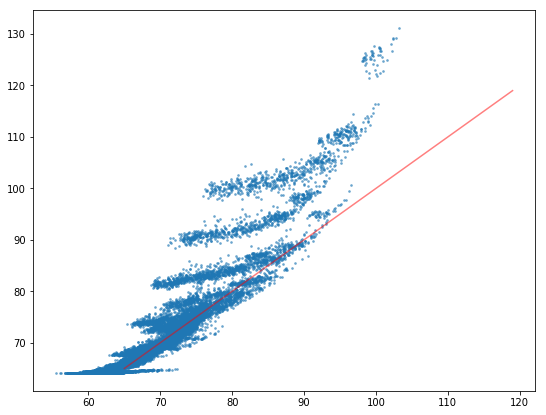

In [33]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.5,s=3)
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.show()

Clustering κατανοηση που χανουμε

χρηση πιο περιπλοκου μοντέλου (keras)

 τα αποτελέσματα /64*100

### Συγκριση neural network και linear regression!

Ολα μαζι σε ένα γραφιμα που σιγα σιγα θα χτίζεται!

## Random Forest

In [10]:
from sklearn.ensemble import RandomForestRegressor
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in [30,40,50,60,70,80,90,92,94,96,98,99]:
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = RandomForestRegressor(max_depth=14,min_samples_leaf=8,random_state=0,n_estimators=25)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_for1 = pd.DataFrame(lst2, columns=cols)
df_for1

30
40
50
60
70
80
90
92
94
96
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,30,2137,3.849332,0.234830,0.014747,0.000746,0.981242,0.001683
1,40,1831,4.026589,0.279164,0.015457,0.000810,0.979208,0.002572
2,50,1526,4.352215,0.342466,0.016813,0.001066,0.976356,0.002594
3,60,1221,4.783360,0.307872,0.018390,0.000851,0.971446,0.003329
4,70,915,5.199216,0.336701,0.020322,0.001123,0.965998,0.004333
5,80,610,6.096919,0.507018,0.023957,0.001452,0.952139,0.006761
6,90,305,7.403636,0.468743,0.030098,0.001362,0.926081,0.007851
7,92,244,7.744763,0.602940,0.032415,0.002041,0.913536,0.014217
8,94,183,8.915631,0.657614,0.037173,0.001695,0.892945,0.018181
9,96,122,10.075971,0.538712,0.044760,0.002666,0.845354,0.025805


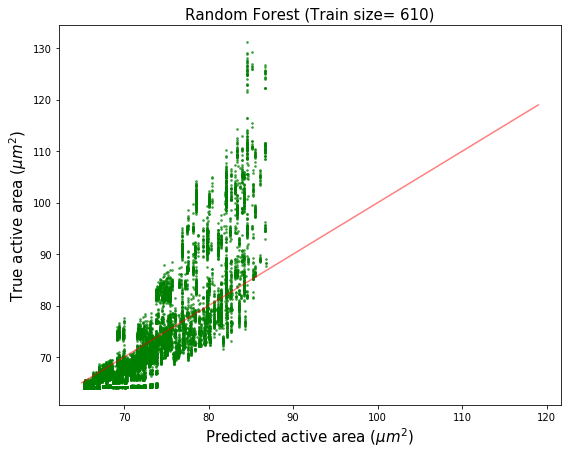

In [7]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.6,s=3,color='green')
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Random Forest (Train size= 610)',fontsize=15)
plt.show()

NameError: name 'tick_spacing' is not defined

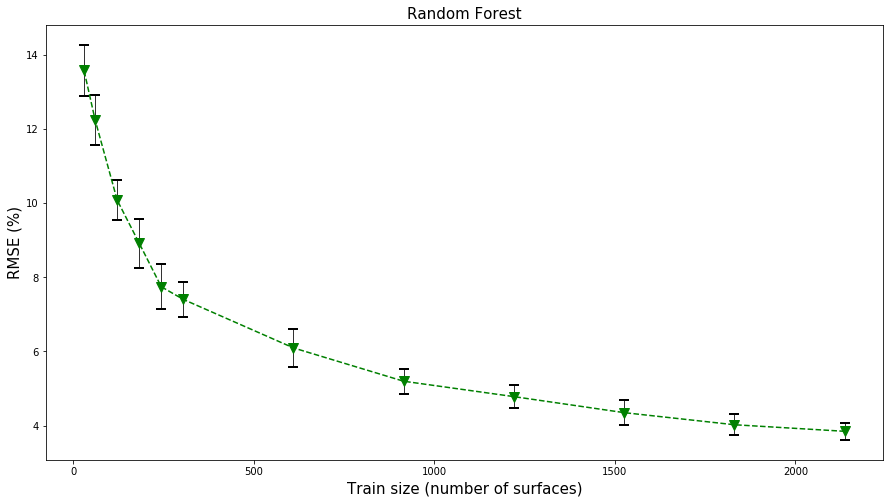

In [11]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker

# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)
line1 = ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green')
#ax1.legend(['mean_RMSE_percentage'],loc=2)
#ax1.legend_.remove()
# now, the second axes that shares the x-axis with the ax1
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#line2 = ax2.errorbar(df_new5 ['Train_size'],df_new5 ['mean_relative_absolute_error'], yerr=df_new5 ['std_mean_relative_absolute_error'],ecolor='black',fmt='xr-',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax2.legend(["mean_rel_absolute_error"],loc=1)
#ylabel('mean_rel_absolute_error')
ylabel('RMSE (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Random Forest',fontsize=15)

ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)
show()
show()

In [11]:
from sklearn.ensemble import RandomForestRegressor
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,100,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        regr = RandomForestRegressor(max_depth=9,min_samples_leaf=3,random_state=0)
        regr.fit(X_train, y_train)
        pre= regr.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_for2 = pd.DataFrame(lst2, columns=cols)
df_for2

90
91
92
93
94
95
96
97
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,5.847661,0.557773,0.023474,0.001686,0.957085,0.008110
1,91,274,6.130365,0.720988,0.024551,0.002320,0.951165,0.011099
2,92,244,6.430248,0.604221,0.026150,0.002198,0.943121,0.013563
3,93,213,6.686881,0.585356,0.027071,0.001987,0.942478,0.011693
4,94,183,7.154924,0.848636,0.029277,0.002137,0.935181,0.011849
5,95,152,7.359820,0.925909,0.031007,0.003269,0.927940,0.022433
6,96,122,7.832754,0.779510,0.033427,0.002461,0.918386,0.016413
7,97,91,9.152961,0.831485,0.039164,0.002188,0.888391,0.023789
8,98,61,10.094713,0.782588,0.044722,0.002525,0.850268,0.025477
9,99,30,12.024866,1.102449,0.059961,0.006724,0.754646,0.076812


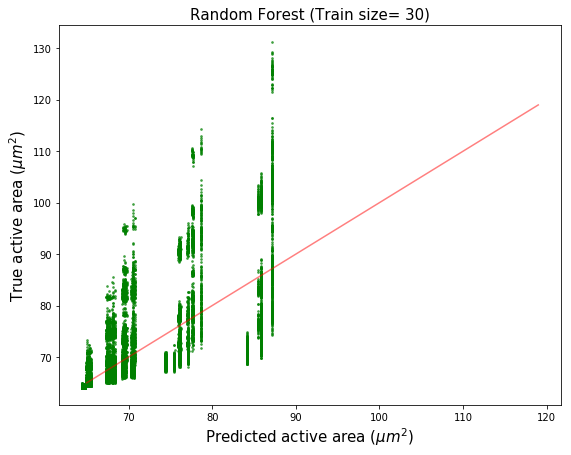

In [12]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.6,s=3,color='green')
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Random Forest (Train size= 30)',fontsize=15)
plt.show()

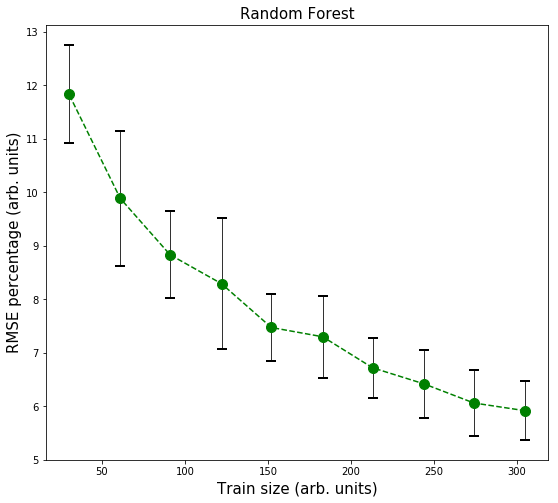

In [46]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)
line1 = ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green')
#ax1.legend(['mean_RMSE_percentage'],loc=2)

ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#line2 = ax2.errorbar(df_new5 ['Train_size'],df_new5 ['mean_relative_absolute_error'], yerr=df_new5 ['std_mean_relative_absolute_error'],ecolor='black',fmt='xr-',capthick=2)
#ax2.yaxis.tick_right()
tick_spacing =50
#ax2.yaxis.set_label_position("right")
#ax2.legend(["mean_rel_absolute_error"],loc=1)
#ylabel('mean_rel_absolute_error')
plt.title('Random Forest',fontsize=15)


ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
show()

## Random forest vs Linear Regression

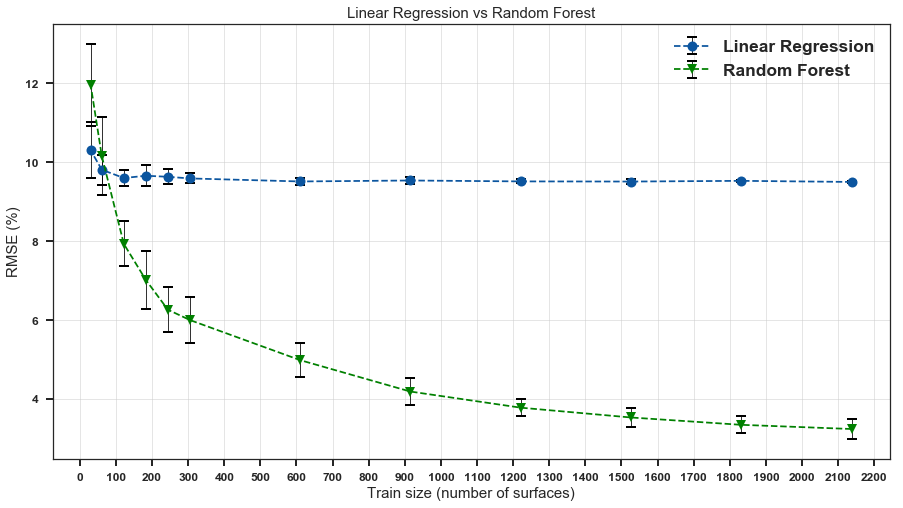

In [13]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15)
plt.title('Linear Regression vs Random Forest',fontsize=15)

tick_spacing =100
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

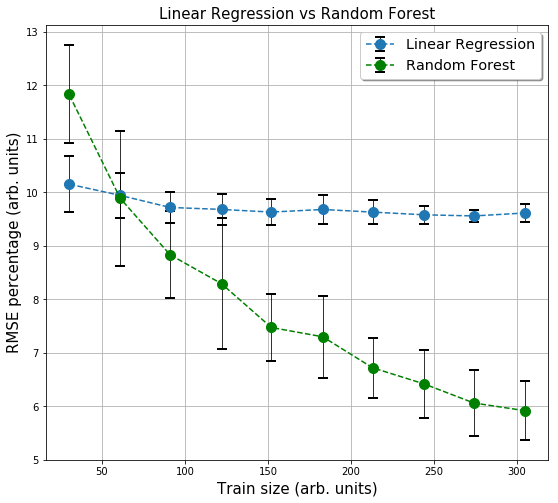

In [59]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest',fontsize=15)

tick_spacing =50
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

## Neural network

In [11]:
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in [30,40,50,60,70,80,90,92,94]:
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,2,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        mlpred=MLPRegressor(random_state=25,hidden_layer_sizes=(1,1),batch_size=10,activation='relu')
        mlpred.fit(X_train, y_train)
        pre= mlpred.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_net1 = pd.DataFrame(lst2, columns=cols)
df_net1

30
40
50
60
70
80
90
92
94


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,30,2137,52.428669,0.0,0.423744,0.0,NaN,NaN
1,40,1831,61.101941,0.0,0.504565,0.0,NaN,NaN
2,50,1526,70.218159,0.0,0.588487,0.0,-5.104491e-16,0.0
3,60,1221,79.146530,0.0,0.670025,0.0,NaN,NaN
4,70,915,88.441154,0.0,0.754440,0.0,NaN,NaN
5,80,610,97.799792,0.0,0.839097,0.0,5.104491e-16,0.0
6,90,305,106.900033,0.0,0.921177,0.0,NaN,NaN
7,92,244,108.723826,0.0,0.937604,0.0,NaN,NaN
8,94,183,110.550262,0.0,0.954048,0.0,-5.207725e-16,0.0


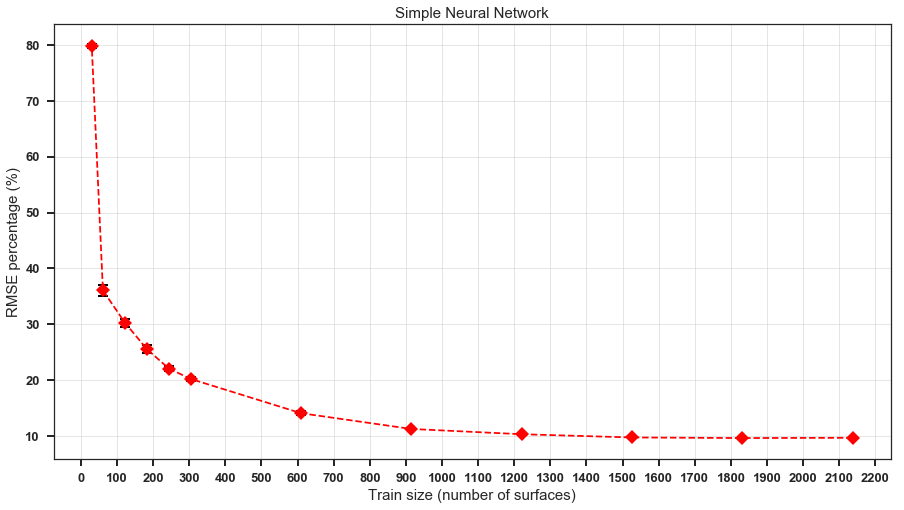

In [30]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_net1['Train_size'],df_net1['mean_Final_RMSE'], yerr=df_net1['std_final_rmse'],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red')
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
#tick_spacing = 250
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Simple Neural Network',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
plt.grid(True)
tick_spacing=100
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=13)

In [25]:
df_net1['Train_size'][:-1]

0     2137
1     1831
2     1526
3     1221
4      915
5      610
6      305
7      244
8      183
9      122
10      61
Name: Train_size, dtype: int64

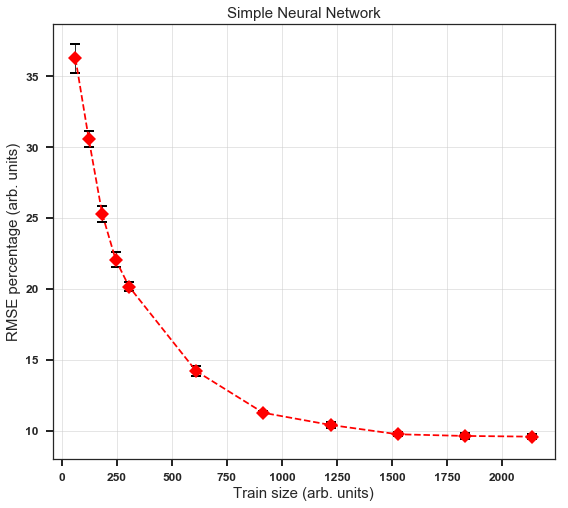

In [29]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_net1['Train_size'][:-1],df_net1['mean_Final_RMSE'][:-1], yerr=df_net1['std_final_rmse'][:-1],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red')
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 250
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Simple Neural Network',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)
show()
show()

In [16]:
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,100,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        mlpred=MLPRegressor(random_state=25,hidden_layer_sizes=(3,4),batch_size=20,activation='relu')
        mlpred.fit(X_train, y_train)
        pre= mlpred.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_net2 = pd.DataFrame(lst2, columns=cols)
df_net2

90
91
92
93
94
95
96
97
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,20.161045,0.193597,0.115065,0.002240,-0.271040,0.018599
1,91,274,21.524535,0.343237,0.124495,0.003320,-0.235777,0.029055
2,92,244,21.900206,0.391966,0.128656,0.004030,-0.220740,0.032971
3,93,213,25.278701,0.643182,0.155562,0.006096,-0.138962,0.016146
4,94,183,25.193526,0.658357,0.157098,0.005845,-0.135314,0.013490
5,95,152,30.223527,0.530105,0.195942,0.003965,-0.081280,0.004724
6,96,122,30.351608,0.585729,0.200323,0.005219,-0.078165,0.005192
7,97,91,33.832114,0.426075,0.223329,0.002688,-0.059593,0.002288
8,98,61,35.747847,0.590149,0.236940,0.003879,-0.050097,0.001828
9,99,30,79.922688,0.340560,0.669762,0.003123,-0.042140,0.003894


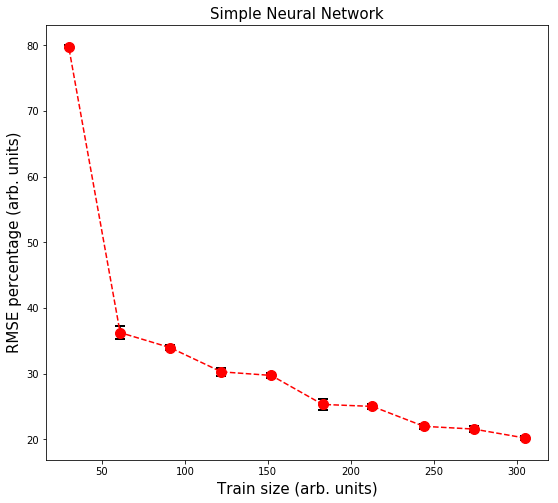

In [67]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_net2['Train_size'],df_net2['mean_Final_RMSE'], yerr=df_net2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red')
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 50
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Simple Neural Network',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
show()

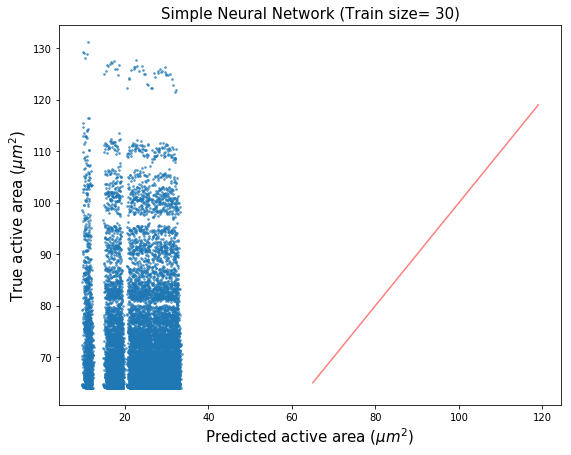

In [68]:
plt.figure(figsize=(9,7))
plt.scatter(pre,y1_held,alpha=0.6,s=3)
x = np.arange(65, 120)
plt.plot(x,x,'r',alpha=0.5)
plt.ylabel('True active area ($μm^2$)',fontsize=15)
plt.xlabel('Predicted active area ($μm^2$)',fontsize=15)
plt.title('Simple Neural Network (Train size= 30)',fontsize=15)
plt.show()

## all models 1

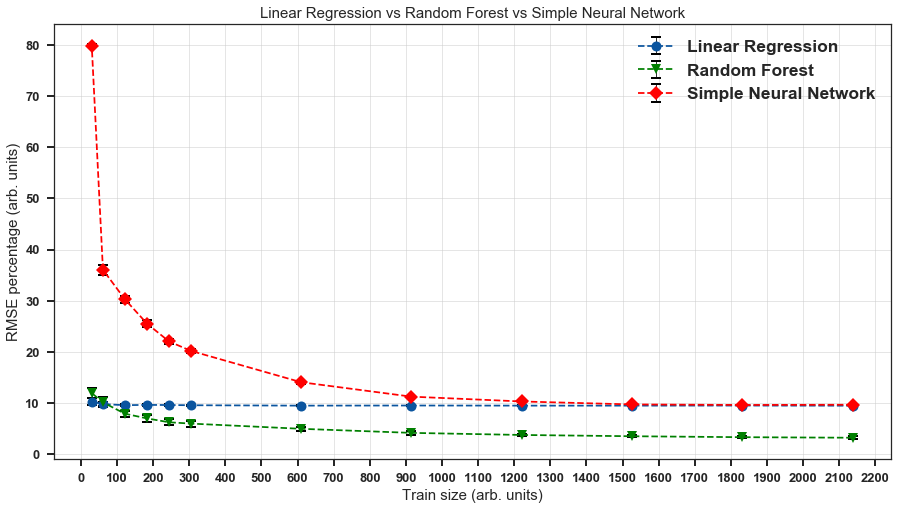

In [29]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net1['Train_size'],df_net1['mean_Final_RMSE'], yerr=df_net1['std_final_rmse'],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Simple Neural Network',fontsize=15)


plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=13)

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

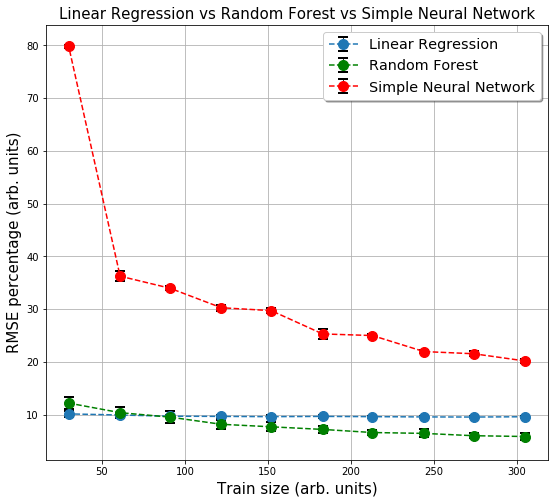

In [70]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net2['Train_size'],df_net2['mean_Final_RMSE'], yerr=df_net2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Simple Neural Network',fontsize=15)

tick_spacing =50
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

# More complicated Neural Network

In [16]:
# more complicated neural net!
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in [30,40,50,60,70,80,90,92,94,96,98,99]:
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        mlpred=MLPRegressor(random_state=25,hidden_layer_sizes=(15,25,40,25,15),batch_size=20,activation='relu')
        mlpred.fit(X_train, y_train)
        pre= mlpred.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_net3 = pd.DataFrame(lst2, columns=cols)
df_net3

30
40
50
60
70
80
90
92
94
96
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,30,2137,7.314176,0.650194,0.038464,0.004550,0.913550,0.016193
1,40,1831,7.763929,0.776018,0.041605,0.005127,0.908755,0.013235
2,50,1526,7.762009,0.561198,0.041576,0.004460,0.902461,0.017171
3,60,1221,9.038580,1.279208,0.048912,0.007676,0.861893,0.046712
4,70,915,9.199112,1.379186,0.048763,0.008388,0.863227,0.043245
5,80,610,10.290597,1.730762,0.055213,0.011319,0.822876,0.061409
6,90,305,15.044038,1.590952,0.085567,0.013363,0.549766,0.265289
7,92,244,15.880429,1.636950,0.090580,0.014503,0.331260,0.351000
8,94,183,17.131510,1.356872,0.096745,0.008599,0.093264,0.298347
9,96,122,18.959595,0.579254,0.102702,0.005688,-0.225850,0.063928


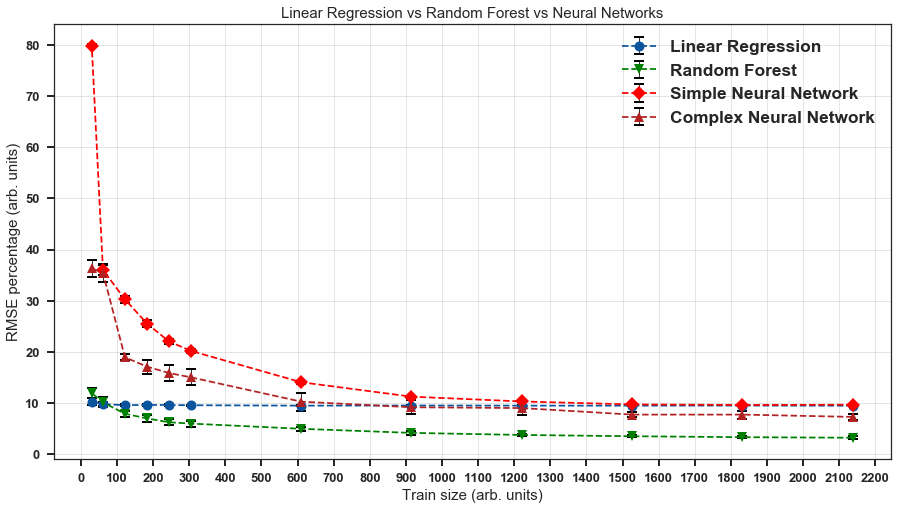

In [28]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net1['Train_size'],df_net1['mean_Final_RMSE'], yerr=df_net1['std_final_rmse'],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
ax1.errorbar(df_net3['Train_size'],df_net3['mean_Final_RMSE'], yerr=df_net3['std_final_rmse'],ecolor='black',fmt='--^',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Neural Networks',fontsize=15)

plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=13)

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#ax1.set_yscale("log", nonposy='clip')
plt.grid(True) 
show()

In [ ]:
[:-1]

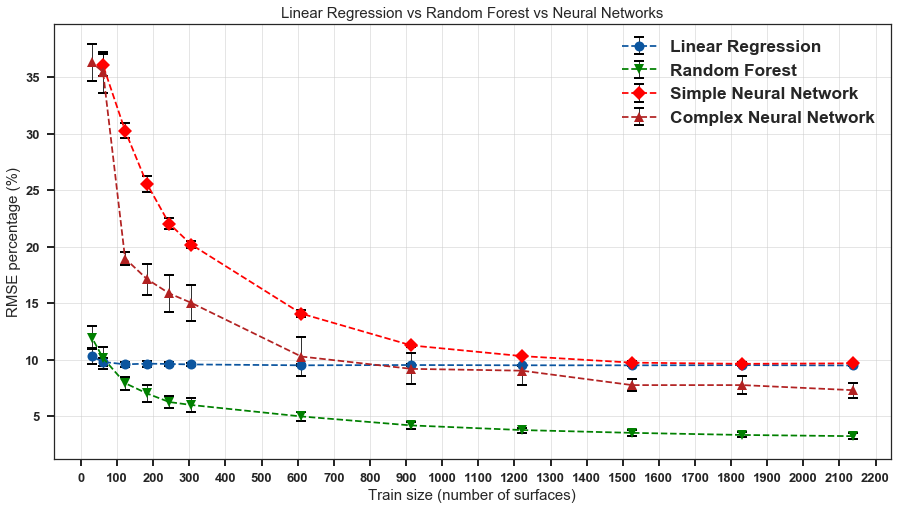

In [31]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net1['Train_size'][:-1],df_net1['mean_Final_RMSE'][:-1], yerr=df_net1['std_final_rmse'][:-1],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
ax1.errorbar(df_net3['Train_size'],df_net3['mean_Final_RMSE'], yerr=df_net3['std_final_rmse'],ecolor='black',fmt='--^',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Neural Networks',fontsize=15)

plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=13)

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#ax1.set_yscale("log", nonposy='clip')
plt.grid(True) 
show()

In [18]:
# more complicated neural net!
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse','mean_relative_absolute_error','std_mean_relative_absolute_error','pears','std_pears']
lst2=[]

for test_s in range(90,100,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,21,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        mlpred=MLPRegressor(random_state=25,hidden_layer_sizes=(15,25,40,25,15),batch_size=20,activation='relu')
        mlpred.fit(X_train, y_train)
        pre= mlpred.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
        lst11.append([mean_relative_absolute_error(y1_held, pre)])
        lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100,np.mean(lst11),np.std(lst11),np.mean(lst111),np.std(lst111)])
df_net4 = pd.DataFrame(lst2, columns=cols)
df_net4

90
91
92
93
94
95
96
97
98
99


,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse,mean_relative_absolute_error,std_mean_relative_absolute_error,pears,std_pears
0,90,305,14.526333,1.863508,0.082583,0.015329,0.550180,0.279793
1,91,274,14.644945,1.924737,0.078727,0.011668,0.567483,0.272677
2,92,244,15.828398,1.647431,0.089313,0.010718,0.368662,0.309923
3,93,213,16.049011,1.110249,0.094325,0.007880,0.379011,0.320280
4,94,183,17.578337,1.069555,0.099357,0.007414,-0.039117,0.254512
5,95,152,17.197957,1.582178,0.099742,0.011589,0.046161,0.323877
6,96,122,20.393668,4.888811,0.118754,0.039465,-0.199344,0.081686
7,97,91,32.367486,5.957175,0.218901,0.049097,-0.062709,0.042786
8,98,61,35.329186,1.431058,0.247241,0.019935,-0.053740,0.003102
9,99,30,36.048303,1.399618,0.256903,0.017495,-0.052416,0.000697


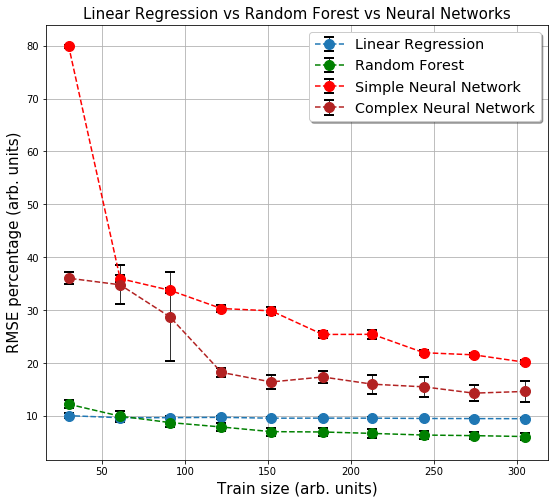

In [28]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net2['Train_size'],df_net2['mean_Final_RMSE'], yerr=df_net2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
ax1.errorbar(df_net4['Train_size'],df_net4['mean_Final_RMSE'], yerr=df_net4['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Neural Networks',fontsize=15)

tick_spacing =50
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

# Deep Neural Network

In [6]:
import keras
from keras.layers import *

Using TensorFlow backend.


In [33]:
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse']
lst2=[]

for test_s in [30,40,50,60,70,80,90,92,94,96,98,99]:
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,8,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        
        net1Model=keras.models.Sequential()
        net1Model.add(Dense(10,input_shape=(5,)))
        net1Model.add(Activation('relu'))
        net1Model.add(Dense(100))
        net1Model.add(Dropout(0.5))
        net1Model.add(Dense(100))
        net1Model.add(GaussianNoise(1.0))
        net1Model.add(Dense(1))
        net1Model.compile(optimizer='rmsprop',
              loss='mse')
        net1Model.fit(X1, y1,epochs=1000,verbose=1)
        
        
        
        pre= net1Model.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
       # lst11.append([mean_relative_absolute_error(y1_held, pre)])
       # lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100])
df_net5 = pd.DataFrame(lst2, columns=cols)
df_net5

30
Epoch 1/1000
3053/3053 [==============================] - 1s 389us/step - loss: 1552.5885
Epoch 2/1000
3053/3053 [==============================] - 0s 71us/step - loss: 612.8400
Epoch 3/1000
3053/3053 [==============================] - 0s 60us/step - loss: 413.7177
Epoch 4/1000
3053/3053 [==============================] - 0s 88us/step - loss: 263.7641
Epoch 5/1000
3053/3053 [==============================] - 0s 53us/step - loss: 167.9716
Epoch 6/1000
3053/3053 [==============================] - 0s 41us/step - loss: 136.9891
Epoch 7/1000
3053/3053 [==============================] - 0s 42us/step - loss: 126.5372
Epoch 8/1000
3053/3053 [==============================] - 0s 41us/step - loss: 125.0161
Epoch 9/1000
3053/3053 [==============================] - 0s 55us/step - loss: 124.2210
Epoch 10/1000
3053/3053 [==============================] - 0s 56us/step - loss: 125.6277
Epoch 11/1000
3053/3053 [==============================] - 0s 74us/step - loss: 113.5168
Epoch 12/1000
3053/3053 [

,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse
0,30,2137,3.476775,1.672747
1,40,1831,3.336995,1.260162
2,50,1526,3.327660,0.927431
3,60,1221,2.946545,0.614656
4,70,915,3.281418,1.327392
5,80,610,2.977716,1.162472
6,90,305,3.614617,1.967382
7,92,244,2.990564,0.881967
8,94,183,3.983610,1.550753
9,96,122,3.664406,2.395487


NameError: name 'df_net5' is not defined

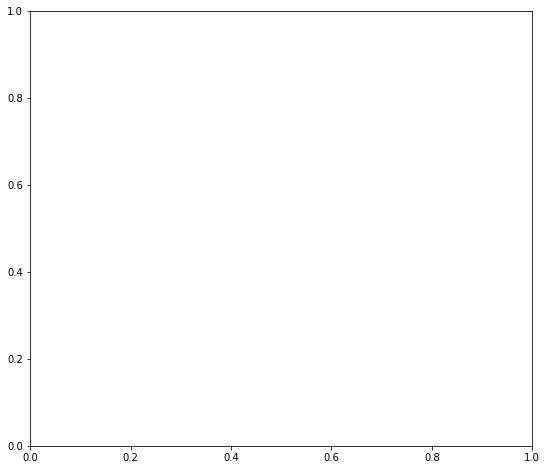

In [7]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_net5['Train_size'],df_net5['mean_Final_RMSE'], yerr=df_net5['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='black')
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 250
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Deep Neural Network',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
show()

In [8]:
cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse']
lst2=[]

for test_s in range(80,81,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(9,10,1):
        rand=random.randint(1, 10000)
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        
        net1Model=keras.models.Sequential()
        net1Model.add(Dense(10,input_shape=(5,)))
        net1Model.add(Activation('relu'))
        net1Model.add(Dense(100))
        net1Model.add(Dropout(0.5))
        net1Model.add(Dense(100))
        net1Model.add(GaussianNoise(1.0))
        net1Model.add(Dense(1))
        net1Model.compile(optimizer='rmsprop',
              loss='mse')
        net1Model.fit(X1, y1,epochs=1000,verbose=1)
        
        
        
        pre= net1Model.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
       # lst11.append([mean_relative_absolute_error(y1_held, pre)])
       # lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100])
df_net6 = pd.DataFrame(lst2, columns=cols)
df_net6

80
Epoch 1/1000
3053/3053 [==============================] - 1s 326us/step - loss: 1318.8967
Epoch 2/1000
3053/3053 [==============================] - 0s 84us/step - loss: 645.4473
Epoch 3/1000
3053/3053 [==============================] - 0s 75us/step - loss: 460.0751
Epoch 4/1000
3053/3053 [==============================] - 0s 67us/step - loss: 280.5285
Epoch 5/1000
3053/3053 [==============================] - 0s 98us/step - loss: 174.6576
Epoch 6/1000
3053/3053 [==============================] - 0s 62us/step - loss: 152.1081
Epoch 7/1000
3053/3053 [==============================] - 0s 68us/step - loss: 145.9791
Epoch 8/1000
3053/3053 [==============================] - 0s 95us/step - loss: 137.7513
Epoch 9/1000
3053/3053 [==============================] - 0s 101us/step - loss: 130.9251
Epoch 10/1000
3053/3053 [==============================] - 0s 82us/step - loss: 121.6875
Epoch 11/1000
3053/3053 [==============================] - 0s 77us/step - loss: 122.3585
Epoch 12/1000
3053/3053 

,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse
0,80,610,4.054019,0.0


In [8]:
df_net6

,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse
0,94,183,3.355574,1.733773


In [8]:

#TESTING FAILURE OF DEEP NEURAL NETWORK

cols = ['test_percentage','Train_size','mean_Final_RMSE','std_final_rmse']
lst2=[]
rand=0
for test_s in range(94,95,1):
    lst11=[]
    lst1 = []
    lst111=[]
    print(test_s)
    for i in range(1,1,1):
        rand= rand+1
        
        X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=test_s/100 ,random_state=rand)
        
        net1Model=keras.models.Sequential()
        net1Model.add(Dense(10,input_shape=(5,)))
        net1Model.add(Activation('relu'))
        net1Model.add(Dense(100))
        net1Model.add(Dropout(0.5))
        net1Model.add(Dense(100))
        net1Model.add(GaussianNoise(1.0))
        net1Model.add(Dense(1))
        net1Model.compile(optimizer='rmsprop',
              loss='mse')
        net1Model.fit(X1, y1,epochs=1000,verbose=1)
        
        
        
        pre= net1Model.predict(X1_held)
        
        lst1.append([np.sqrt(metrics.mean_squared_error(y1_held, pre))])
       # lst11.append([mean_relative_absolute_error(y1_held, pre)])
       # lst111.append([  np.corrcoef(y1_held, pre)[0, 1]])
    lst2.append([test_s,len(X_train),np.mean(lst1)/64*100,np.std(lst1)/64*100])
df_net6 = pd.DataFrame(lst2, columns=cols)
df_net6

94
Epoch 1/1000
3053/3053 [==============================] - 1s 266us/step - loss: 1326.6472
Epoch 2/1000
3053/3053 [==============================] - 0s 79us/step - loss: 689.2055
Epoch 3/1000
3053/3053 [==============================] - 0s 90us/step - loss: 520.4304
Epoch 4/1000
3053/3053 [==============================] - 0s 83us/step - loss: 312.5358
Epoch 5/1000
3053/3053 [==============================] - 0s 84us/step - loss: 171.9432
Epoch 6/1000
3053/3053 [==============================] - 0s 81us/step - loss: 148.0466
Epoch 7/1000
3053/3053 [==============================] - 0s 103us/step - loss: 136.6610
Epoch 8/1000
3053/3053 [==============================] - 0s 79us/step - loss: 130.9668
Epoch 9/1000
3053/3053 [==============================] - 0s 78us/step - loss: 131.8592
Epoch 10/1000
3053/3053 [==============================] - 0s 99us/step - loss: 130.2848
Epoch 11/1000
3053/3053 [==============================] - 0s 74us/step - loss: 123.2565
Epoch 12/1000
3053/3053 

,test_percentage,Train_size,mean_Final_RMSE,std_final_rmse
0,94,183,3.636508,1.424372


In [9]:
for layer in net1Model.layers:
    weights = layer.get_weights()

In [10]:
coeff_df=pd.DataFrame(net1Model.layers[0].get_weights()[0])

In [11]:
coeff_df

,0,1,2,3,4,5,6,7,8,9
0,-5.283056,-0.317213,-0.558975,4.454593,4.941761,0.276320,4.616508,0.179417,5.024415,4.220914
1,0.340150,-0.443404,-0.173068,0.078700,-0.414021,0.575521,-0.470016,-0.400580,-0.119762,-2.097360
2,0.833378,0.569529,0.065257,-2.191328,-0.068642,-0.627523,-0.572247,-0.349586,-0.095859,0.113903
3,-0.026877,0.630492,-0.087101,-0.001769,-0.014400,-0.019782,-0.000422,0.027664,-0.003078,-0.002497
4,0.187955,-0.342827,-0.261427,-0.005262,0.087310,-0.349288,-0.002699,-0.236559,-0.000554,-0.002972


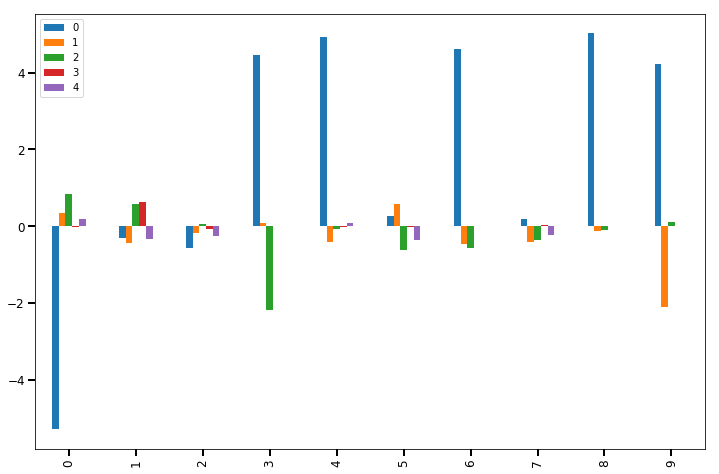

In [12]:
#df11=pd.DataFrame(coeff_df)
#df22=df11.transpose()
plt.Figure(figsize=(12,3))
coeff_df.transpose().plot.bar(figsize=(12,8))
plt.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)

In [18]:
coeff_df.transpose().apply(abs).mean()

0    2.987318
1    0.511258
2    0.548725
3    0.081408
4    0.147685
dtype: float32

In [33]:
r=[10,-1.5,-1.6,0.2,0.4]
r_df=pd.DataFrame(r,["Rms","ξx",'ξy','Skewness','Kurtosis'])

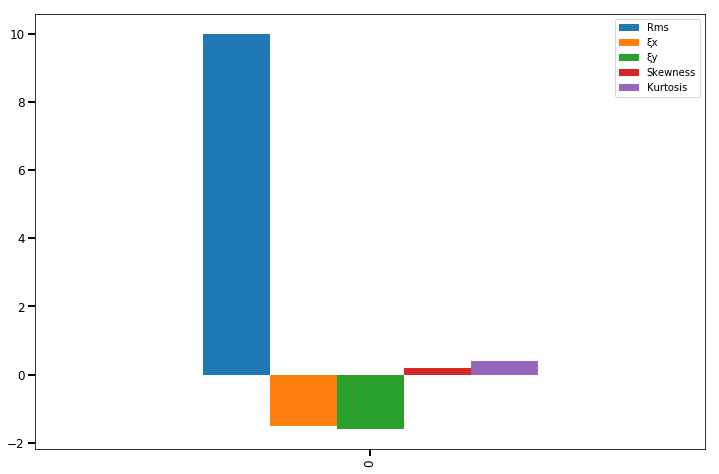

In [34]:
#df11=pd.DataFrame(coeff_df)
#df22=df11.transpose()
plt.Figure(figsize=(12,3))
r_df.transpose().plot.bar(figsize=(12,8))
plt.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=12)

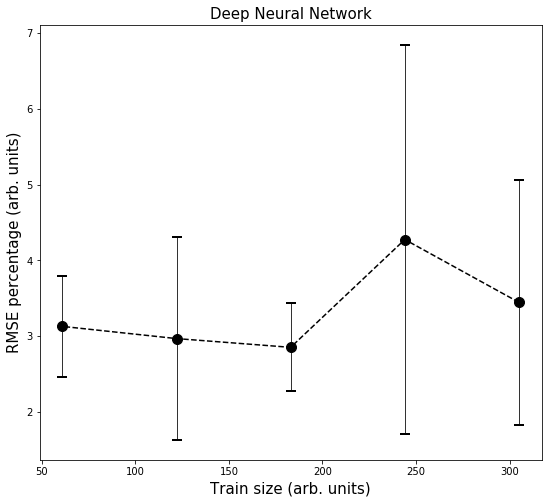

In [19]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_net6['Train_size'],df_net6['mean_Final_RMSE'], yerr=df_net6['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='black')
#ax1.legend(['neural network RMSE'],loc=2)
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
# now, the second axes that shares the x-axis with the ax1
tick_spacing = 50
#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
#ax1.errorbar(df_new5['Train_size'] ,df_new5 ['mean_Final_RMSE'], yerr=df_new5 ['std_final_rmse'],ecolor='black',fmt='xr-',label='linear regression RMSE',capthick=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
plt.title('Deep Neural Network',fontsize=15)
#legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
show()

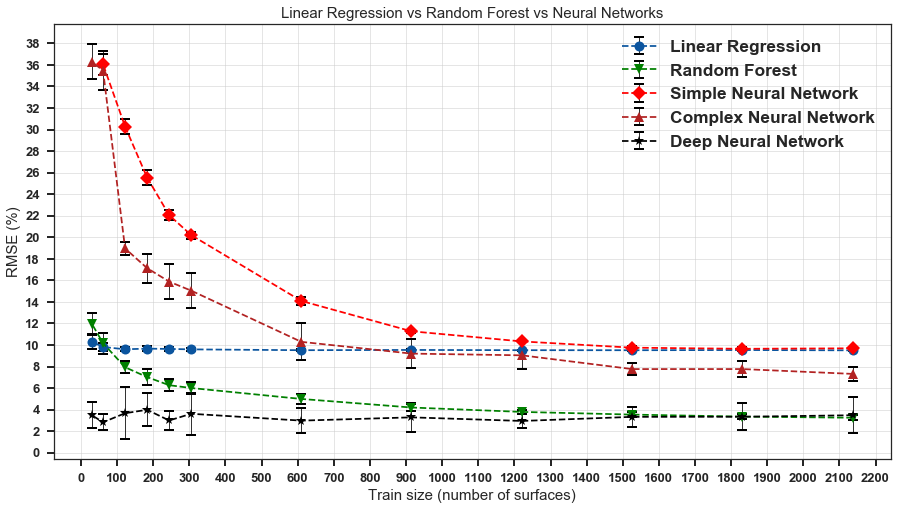

In [37]:
from pylab import figure, show, legend, ylabel
import matplotlib.ticker as ticker
# create the general figure
fig1 = figure(figsize=(15,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg1['Train_size'],df_reg1['mean_Final_RMSE'], yerr=df_reg1['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for1 ['Train_size'],df_for1 ['mean_Final_RMSE'], yerr=df_for1 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net1['Train_size'][:-1],df_net1['mean_Final_RMSE'][:-1], yerr=df_net1['std_final_rmse'][:-1],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
ax1.errorbar(df_net3['Train_size'],df_net3['mean_Final_RMSE'], yerr=df_net3['std_final_rmse'],ecolor='black',fmt='--^',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
ax1.errorbar(df_net5['Train_size'],df_net5['mean_Final_RMSE'], yerr=df_net5['std_final_rmse'],ecolor='black',fmt='--*',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='black',label='Deep Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE (%)',fontsize=15)
plt.xlabel('Train size (number of surfaces)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Neural Networks',fontsize=15)

plt.grid(True)
ax1.tick_params(direction='out', length=7, width=2,
                grid_alpha=0.5,labelsize=13)

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')
ax1.tick_spacing = 100

ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#ax1.set_yscale("log", nonposy='clip')
ax1.yaxis.set_major_locator(ticker.MultipleLocator(2))
plt.grid(True) 

#ax1.set_yscale("log", nonposy='clip')
show()

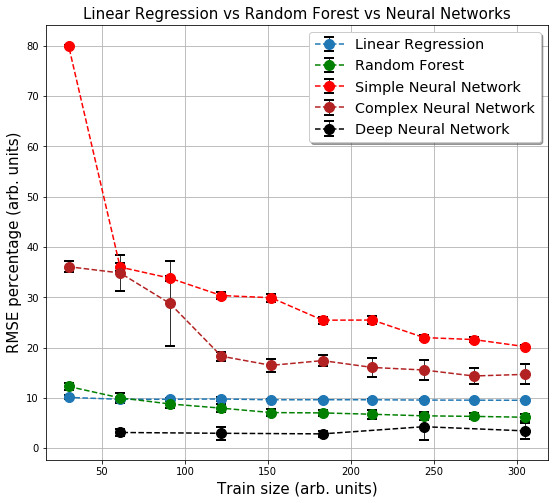

In [27]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--v',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
ax1.errorbar(df_net2['Train_size'][:-1],df_net2['mean_Final_RMSE'][:-1], yerr=df_net2['std_final_rmse'][:-1],ecolor='black',fmt='--D',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
ax1.errorbar(df_net4['Train_size'],df_net4['mean_Final_RMSE'], yerr=df_net4['std_final_rmse'],ecolor='black',fmt='--^',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
ax1.errorbar(df_net6['Train_size'],df_net6['mean_Final_RMSE'], yerr=df_net6['std_final_rmse'],ecolor='black',fmt='--*',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='black',label='Deep Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Neural Networks',fontsize=15)

tick_spacing =50
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()

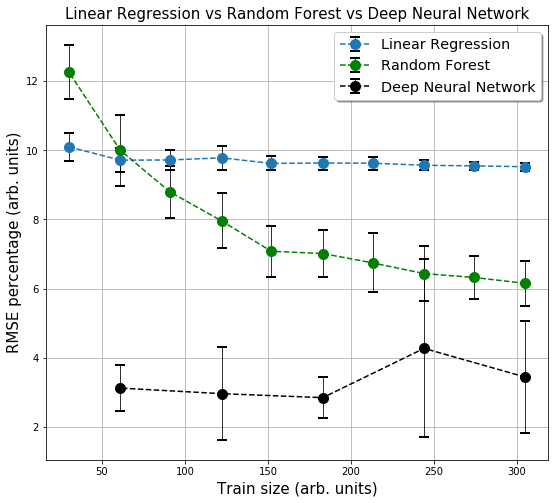

In [26]:
from pylab import figure, show, legend, ylabel
# create the general figure
fig1 = figure(figsize=(9,8))
# and the first axes using subplot populated with data 
ax1 = fig1.add_subplot(111)

ax1.errorbar(df_reg2['Train_size'],df_reg2['mean_Final_RMSE'], yerr=df_reg2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,label='Linear Regression')
#ax1.legend(['neural network RMSE'],loc=2)

# now, the second axes that shares the x-axis with the ax1

#ax2 = fig1.add_subplot(111, sharex=ax1, frameon=False)
ax1.errorbar(df_for2 ['Train_size'],df_for2 ['mean_Final_RMSE'], yerr=df_for2 ['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='green',label='Random Forest')
#ax1.errorbar(df_net2['Train_size'],df_net2['mean_Final_RMSE'], yerr=df_net2['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='red',label='Simple Neural Network')
#ax1.errorbar(df_net4['Train_size'],df_net4['mean_Final_RMSE'], yerr=df_net4['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='firebrick',label='Complex Neural Network')
ax1.errorbar(df_net6['Train_size'],df_net6['mean_Final_RMSE'], yerr=df_net6['std_final_rmse'],ecolor='black',fmt='--o',capthick=2,capsize=5,elinewidth=0.8, markersize=10,color='black',label='Deep Neural Network')
#ax1.legend(['neural network RMSE'],loc=2)
#ax2.yaxis.tick_right()
#ax2.yaxis.set_label_position("right")
#ax1.legend(["liner regression RMSE"],loc=1)
#ylabel('liner regression RMSE')
ylabel('RMSE percentage (arb. units)',fontsize=15)
plt.xlabel('Train size (arb. units)',fontsize=15)
plt.title('Linear Regression vs Random Forest vs Deep Neural Network',fontsize=15)

tick_spacing =50
ax1.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

legend = ax1.legend(loc='down center', shadow=True, fontsize='x-large')

#ax1.set_yscale("log", nonposy='clip')
plt.grid(True)
show()